# Übung 6: CAMSHIFT
## Paper
Lies das Paper "Bradski_etal_1998_camshift.pdf" im KVV (unter "Resources"). 

## Histogramm berechnen
Implementiere eine Funktion, die ein Farbhistogramm erstellt. Übergebe entweder ein Bild und ein ROI, oder das dem ROI unterliegende Bild. Hierzu ermögliche durch die Übergabe eines zweiten (bzw. dritten) Parameters die Zusammenfassung von Farbwerten in n Bins. Lade das Bild "images/racecar.png" und konvertiere das Bild in den HSV-Farbraum. Plotte den Hue-Kanal.

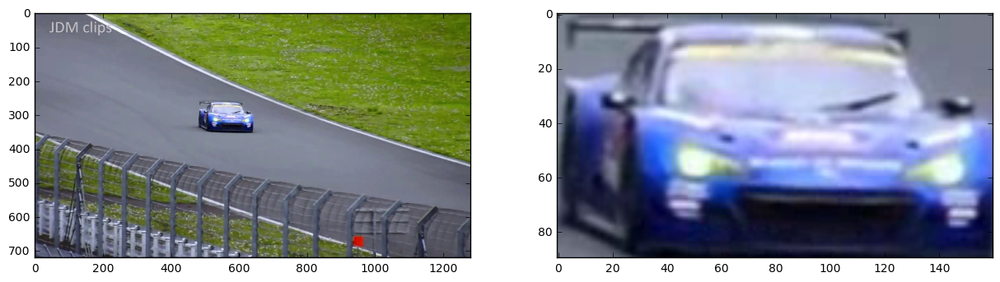

In [7]:
%matplotlib inline 
from skimage import io,color
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import os
import warnings; warnings.simplefilter('ignore')


IMAGES_PER_ROW = 4

MIN_SATURATION_CAR = 0.2
MIN_VALUE_CAR = 0.5
MIN_SATURATION_TACO = 0.8
MIN_VALUE_TACO = 0.2

ROI_FRAME_MARGIN_CAR = 60
ROI_FRAME_MARGIN_TACO = 20


image = io.imread('images/racecar.png')
imageCar = image[260:350, 480:640]

fig = plt.figure(figsize=(15, 10))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

ax1.imshow(image)
ax2.imshow(imageCar)

Nun stelle das Histogramm über dem Hue-Kanal für das gesamte Bild und für den Ausschnitt (x,y) = (480, 260) bis (640, 350) dar. Variiere auch mal testweise die Zahl der Bins. 

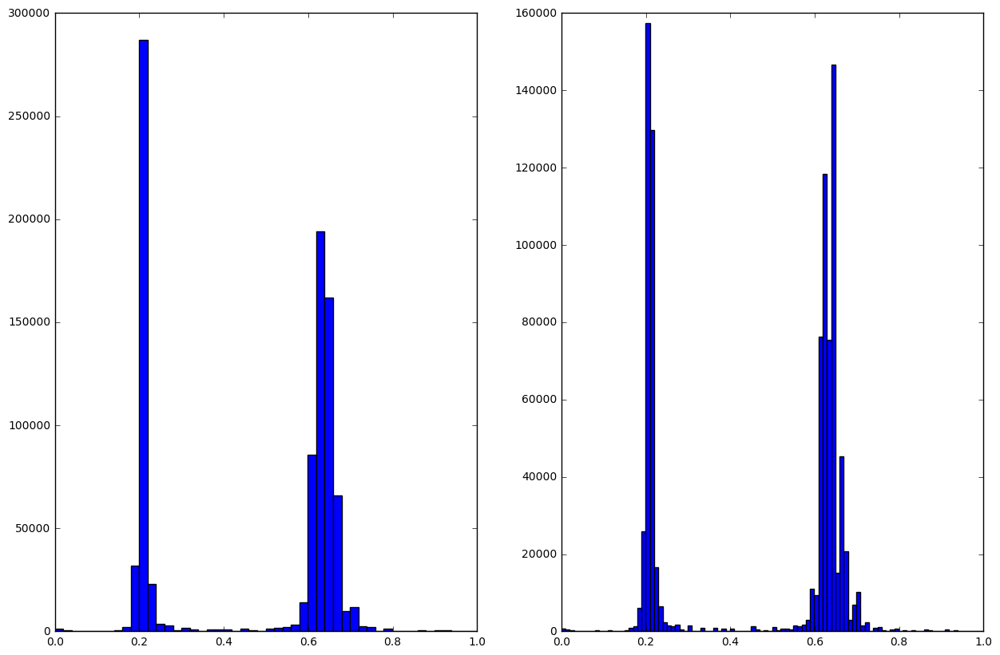

In [2]:
def createColorHistogram(roiImg, binCount = 256, out = plt):
    img_hsv = color.rgb2hsv(roiImg)
    
    hue = img_hsv[:,:,0].ravel()
    
    if out == None:
        hist, binEdges = np.histogram(hue, binCount)
    else:
        hist, binEdges, patches = out.hist(hue, binCount);
    
    return (hist, binEdges)
    
fig = plt.figure(figsize=(15, 10))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)
    
histogram, binEdges = createColorHistogram(image, 50, ax1)
histogramTest = createColorHistogram(image, 100, ax2)

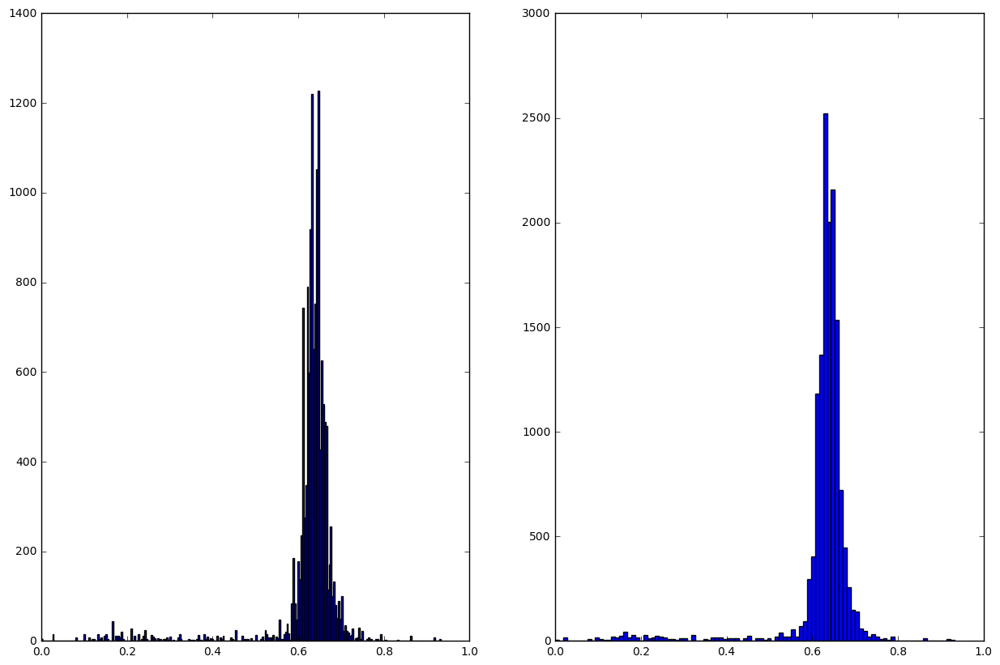

In [3]:
fig = plt.figure(figsize=(15, 10))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)
    
histogramCar = createColorHistogram(imageCar, 256, ax1)
histogramCarTest = createColorHistogram(imageCar, 100, ax2)

## Wahrscheinlichkeitsverteilung
Implementiere die Methode aus der Vorlesung, die Dir - gegeben ein Hue-Histogramm - die Objekt-Wahrscheinlichkeitsverteilung für ein neues Bild berechnet. Erzeuge das Histogramm des Autos aus dem Bild "racecar.png" und wende die neue Funktion auf das letzte frame des Videos (images/racecar/151.jpg) an.

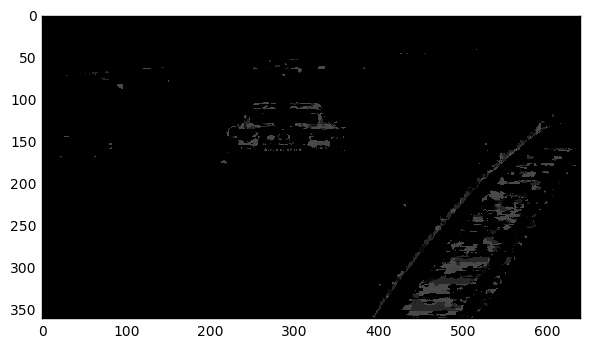

In [22]:
def createProbDistribution(image, histogramRoi, binEdges, minSaturation, minValue):
    img_hsv = color.rgb2hsv(image)
    
    height = len(image)
    width = len(image[0])
    probDistribution = np.zeros((height, width))
    
    histogramSum = sum(histogramRoi)
    
    for y in range(height):
        for x in range(width):
            hue = img_hsv[y, x][0]
            saturation = img_hsv[y, x][1]
            value = img_hsv[y, x][2]
            
            if value < minValue:
                probDistribution[y, x] = 0
                continue
            
            if saturation < minSaturation:
                probDistribution[y, x] = 0
                continue
            
            for i in range(1, len(binEdges)):
                if binEdges[i] > hue:
                    probDistribution[y, x] = histogramRoi[i - 1] / histogramSum
                    break
            
    return probDistribution
            
lastFrame = io.imread('images/racecar/151.jpeg')
histogramCar, binEdges = createColorHistogram(imageCar, 50, ax1)
probDistr = createProbDistribution(lastFrame, histogramCar, binEdges, MIN_SATURATION_CAR, MIN_VALUE_CAR)
io.imshow(probDistr)

### ROI auf Bild anzeigen
Implementiere eine Funktion zum Anzeigen der Grenzen des Tracking-Fensters. Für die Übung reicht es, das Fenster achsenparallel zu formulieren. Stelle das ROI wie oben definiert auf dem Bild der Objekt-Wahrscheinlichkeitsverteilung dar. 

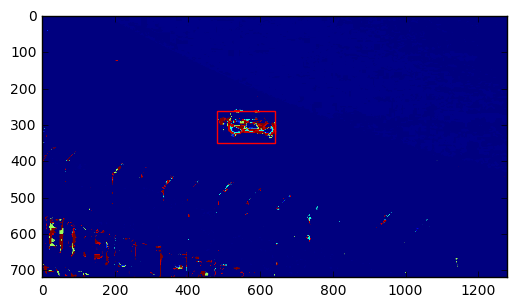

In [23]:
def showRoiFrame(image, x, y, width, height, out = plt):
    currentAxis = plt.gca()
    currentAxis.add_patch(
        patches.Rectangle(
            (x, y),
            width,
            height,
            fill=False,
            edgecolor="red"
        )
    )
    
    out.imshow(image)

probDistr = createProbDistribution(image, histogramCar, binEdges, MIN_SATURATION_CAR, MIN_VALUE_CAR)
showRoiFrame(probDistr, 480, 260, 160, 90)

### CAMSHIFT
Implementiere die Verschiebung und die Anpassung der Größe der ROI wie im Paper beschrieben. Teste den Algorithmus auf den Bildfolgen "images/racecar/*.jpg" und "images/taco/*.jpg". Wähle das Tracking-Fenster geeignet (zur Reduktion der Dateigröße habe ich die Bilder um Faktor 2 verkleinert, d.h. die ROI von oben muss entsprechend angepasst werden). Zeichne als Ausgabe die Trajektorie (die Bewegungsspur) der Objekte, wie durch CAMSHIFT zurückgegeben.  

In [17]:
def getMeanLocation(probDistribution, x, y, width, height, maxWidth, maxHeight):
    m00 = 0
    m10 = 0
    m01 = 0
    
    yStart = np.maximum(0, y)
    yEnd = np.minimum(maxHeight, y + height)
    xStart = np.maximum(0, x)
    xEnd = np.minimum(maxWidth, x + width)
    
    for yi in range(yStart, yEnd):
        for xi in range(xStart, xEnd):
            m00 += probDistribution[yi, xi]
            m10 += xi * probDistribution[yi, xi]
            m01 += yi * probDistribution[yi, xi]
            
    if m00 != 0:
        xc = int(m10 / m00)
        yc = int(m01 / m00)
    else:
        xc = m10
        yc = m01
    
    x2 = int(xc - width / 2)
    y2 = int(yc - height / 2)
    
    return (x2, y2, m00)

def checkSize(size):
    if np.mod(size, 2) == 0:
        size += 1
        
    if size < 3:
        size = 3
        
    return size

def getWindowSize(m00, width, height, ratio):
    h = int(np.round(10 * np.sqrt(m00)))
    w = int(np.round(ratio * h))
            
    w = checkSize(w)
    h = checkSize(h)
    
    return (w, h)

def camshift(imgPath, x, y, width, height, minSaturation, minValue, roiFrameMargin):
    images = os.listdir(imgPath)
    rows = int(len(images) / IMAGES_PER_ROW) + 1

    fig = plt.figure(figsize=(15, 70))
    
    roiRatio = width / height
    
    trajectory = []
    
    for i in range(0, len(images)):
        img = io.imread(imgPath + images[i])
        
        maxHeight = len(img)
        maxWidth = len(img[0])
        
        yRoiStart = np.maximum(0, y - roiFrameMargin)
        yRoiEnd = np.minimum(maxHeight, y + height + roiFrameMargin)
        xRoiStart = np.maximum(0, x - roiFrameMargin)
        xRoiEnd = np.minimum(maxWidth, x + width + roiFrameMargin)
        
        roiImg = img[yRoiStart : yRoiEnd, xRoiStart : xRoiEnd]
                
        histogram, binEdges = createColorHistogram(roiImg, 256, None)
        probDistribution = createProbDistribution(roiImg, histogram, binEdges, minSaturation, minValue)
        
        ax = plt.subplot(rows, IMAGES_PER_ROW, i + 1)
        showRoiFrame(img, x, y, width, height, ax)
        
        heightRoi = len(roiImg)
        widthRoi = len(roiImg[0])
        
        xSearchWindow = roiFrameMargin
        ySearchWindow = roiFrameMargin
        
        m00 = 0
        
        while True:            
            x2, y2, m00 = getMeanLocation(probDistribution, xSearchWindow, ySearchWindow, width, height, widthRoi, heightRoi)
                
            if np.absolute(xSearchWindow - x2) < 10 and np.absolute(ySearchWindow - y2) < 10:
                x = np.absolute(x - roiFrameMargin + x2)
                y = np.absolute(y - roiFrameMargin + y2)
                break
                    
            xSearchWindow = x2
            ySearchWindow = y2
                
        if m00 > 0:
            width, height = getWindowSize(m00, width, height, roiRatio)
        
        yTraj = np.minimum(y + roiFrameMargin + int(height / 2), maxHeight - 1)
        xTraj = np.minimum(x + roiFrameMargin + int(width / 2), maxWidth - 1)
        trajectory.append((yTraj, xTraj))
    
    return trajectory

def showTrajectory(trajectory, img):
    yList = [p[0] for p in trajectory]
    xList = [p[1] for p in trajectory]

    img = io.imread(img)

    plt.plot(xList, yList, linewidth=2)
    plt.axis([0, np.shape(img)[1], np.shape(img)[0], 0])
    plt.show

#### Camshift Car

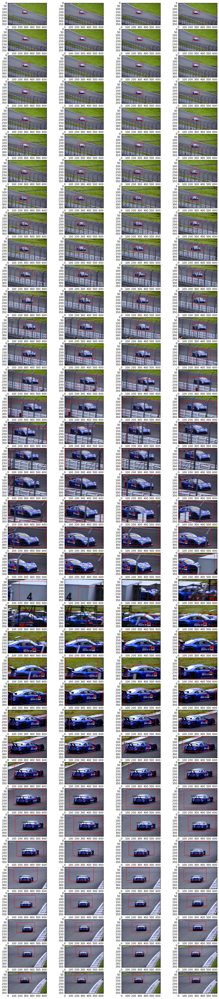

In [19]:
trajectoryCar = camshift("images/racecar/", 240, 130, 80, 45, MIN_SATURATION_CAR, MIN_VALUE_CAR, ROI_FRAME_MARGIN_CAR)

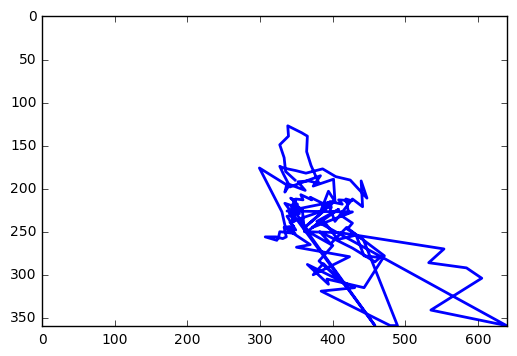

In [21]:
showTrajectory(trajectoryCar, "images/racecar/000.jpeg")

#### Taco Preparation

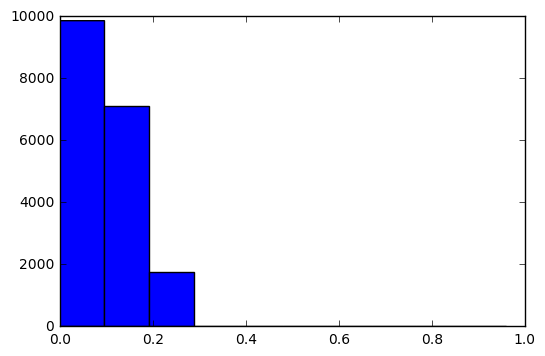

In [185]:
tacoFrame = io.imread('images/taco/001.jpg')
taco = tacoFrame[153:357, 1:93]

histogramTaco, binEdges = createColorHistogram(taco, 10)

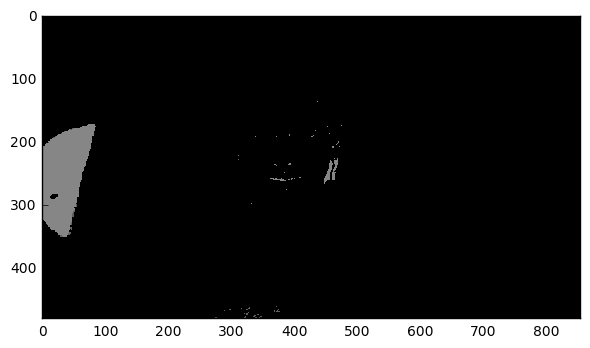

In [186]:
probDistr = createProbDistribution(tacoFrame, histogramTaco, binEdges, MIN_SATURATION_TACO, MIN_VALUE_TACO)
io.imshow(probDistr)

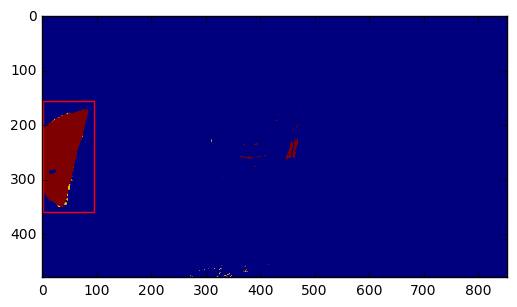

In [187]:
showRoiFrame(probDistr, 1, 156, 93, 204)

#### Camshift Taco

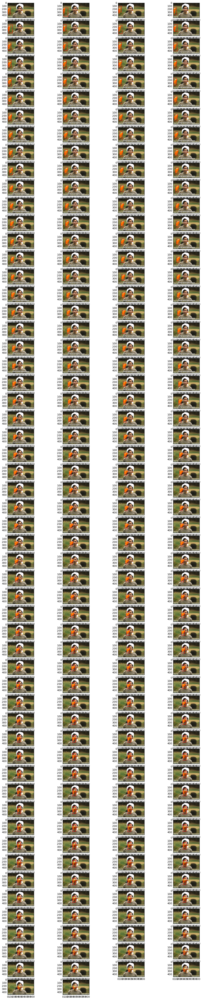

In [14]:
trajectoryTaco = camshift("images/taco/", 0, 156, 93, 204, MIN_SATURATION_TACO, MIN_VALUE_TACO, ROI_FRAME_MARGIN_TACO)

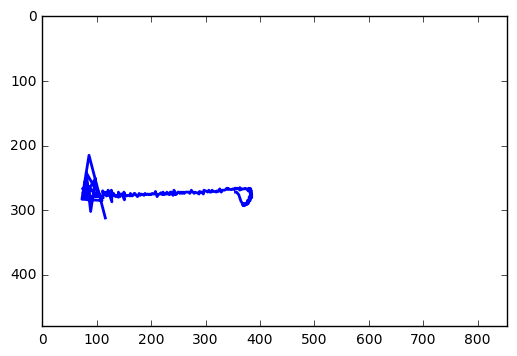

In [18]:
showTrajectory(trajectoryTaco, "images/taco/001.jpg")